In [ ]:
!pip install jmd_imagescraper
from fastai.vision.widgets import *


In [ ]:
from fastai.vision.all import *



In [ ]:
from jmd_imagescraper.imagecleaner import * # dont't worry, it's designed to work with import * 

In [ ]:
from jmd_imagescraper.core import * # dont't worry, it's designed to work with import *
from pathlib import Path
root = Path().cwd()/'peopleimages'
duckduckgo_search(root, "teenagers", "children and teenagers", max_results=40)
duckduckgo_search(root, "adults", "adults", max_results=40)
duckduckgo_search(root, "babys", "babys", max_results=40)
duckduckgo_search(root, "oldpeople", "old people", max_results=40)


Duckduckgo search: children and teenagers


Duckduckgo search: adults


Duckduckgo search: babys


Duckduckgo search: old people


[Path('/notebooks/peopleimages/oldpeople/361_a786f63b.jpg'),
 Path('/notebooks/peopleimages/oldpeople/362_0d7e8446.jpg'),
 Path('/notebooks/peopleimages/oldpeople/363_e83b9393.jpg'),
 Path('/notebooks/peopleimages/oldpeople/364_9a2aa4dd.jpg'),
 Path('/notebooks/peopleimages/oldpeople/365_7bbbd5a9.jpg'),
 Path('/notebooks/peopleimages/oldpeople/366_605f280f.jpg'),
 Path('/notebooks/peopleimages/oldpeople/367_0fd60ca1.jpg'),
 Path('/notebooks/peopleimages/oldpeople/368_a7ff3993.jpg'),
 Path('/notebooks/peopleimages/oldpeople/369_6756b96c.jpg'),
 Path('/notebooks/peopleimages/oldpeople/370_7f1f9abb.jpg'),
 Path('/notebooks/peopleimages/oldpeople/371_4ff3ab13.jpg'),
 Path('/notebooks/peopleimages/oldpeople/372_971fee35.jpg'),
 Path('/notebooks/peopleimages/oldpeople/373_7f0c32d9.jpg'),
 Path('/notebooks/peopleimages/oldpeople/374_8392e53d.jpg'),
 Path('/notebooks/peopleimages/oldpeople/375_86f94ad6.jpg'),
 Path('/notebooks/peopleimages/oldpeople/376_73746d97.jpg'),
 Path('/notebooks/people

In [ ]:

camino='../notebooks/peopleimages'
display_image_cleaner(camino)

HTML(value='<h2>No images left to display in this folder.</h2>', layout=Layout(visibility='hidden'))

GridBox(children=(VBox(children=(Image(value=b'', layout="Layout(width='150px')"), Button(description='Delete'…

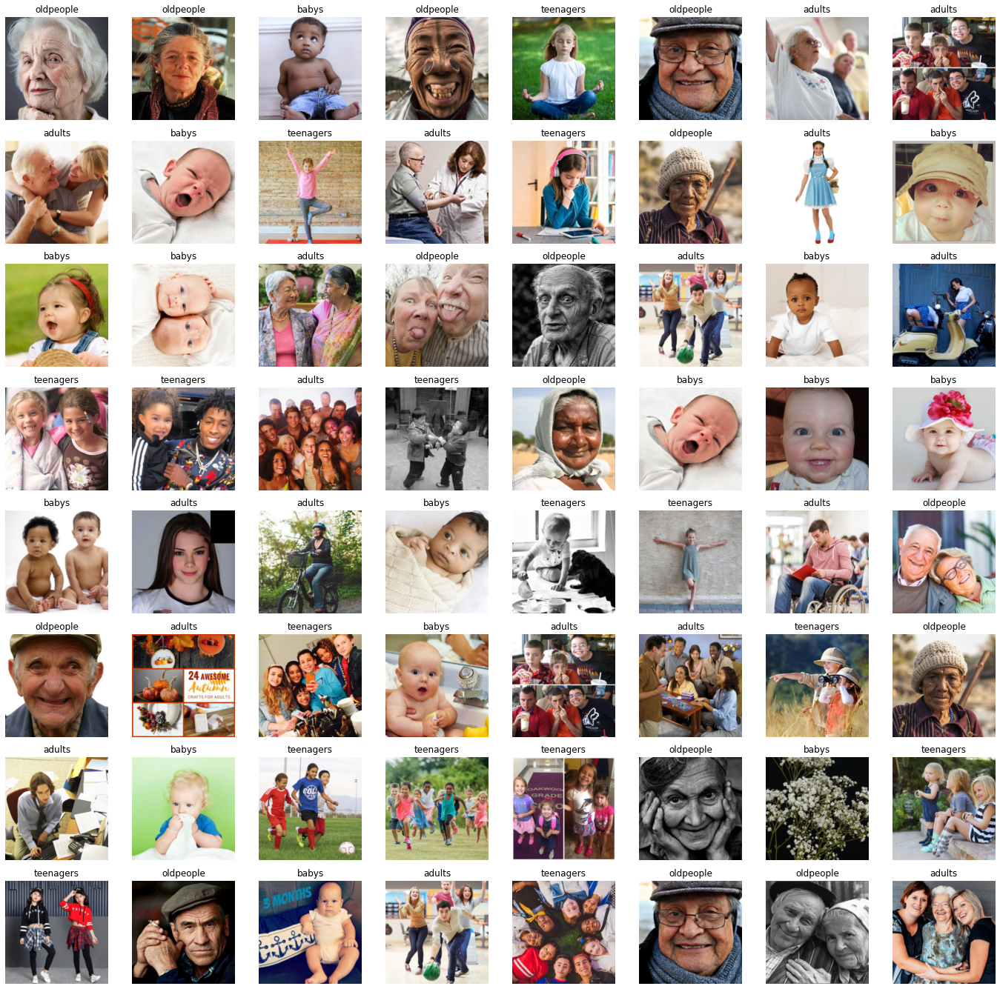

In [ ]:
#cuando creo el dataloader recién ahi le pasa el path para buscar las imagenes
 
edades = DataBlock(blocks=(ImageBlock, CategoryBlock),get_items=get_image_files,item_tfms=Resize(224), get_y = parent_label,splitter=RandomSplitter())
# get_image_files is a fastai function that helps us grab all the image files (recursively) in one folder.

#files = get_image_files(path/"images")
#len(files)


#def parent (path):
    #return path.parent.name

#parent(Path('../notebooks/peopleimages/babys/068_4b7c2456.jpg'))

dls=edades.dataloaders(camino)
dls.valid.show_batch(max_n=64)

In [ ]:
edades.datasets('../notebooks/peopleimages/')
edades.datasets('../notebooks/peopleimages/')[0]

# no puedo darle a la red neural este nommbre de archivo, 
#asique necesito codificar para que nos de una imagen y lo convierta en binario o en tensor


(PILImage mode=RGB size=474x592, TensorCategory(1))

In [ ]:
def parent (path):
    return path.parent.name

parent(Path('../notebooks/peopleimages/babys/068_4b7c2456.jpg'))


'babys'

In [ ]:
learn= cnn_learner(dls,resnet34,metrics=error_rate)
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.397435,0.399289,0.131579,00:14
1,0.726356,0.167705,0.049342,00:11
2,0.448531,0.148767,0.049342,00:11
3,0.298940,0.143416,0.046053,00:11


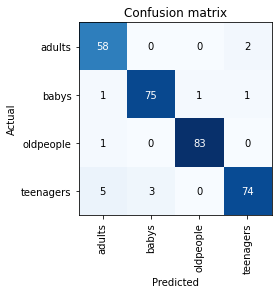

In [ ]:
#learn.show_results()
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

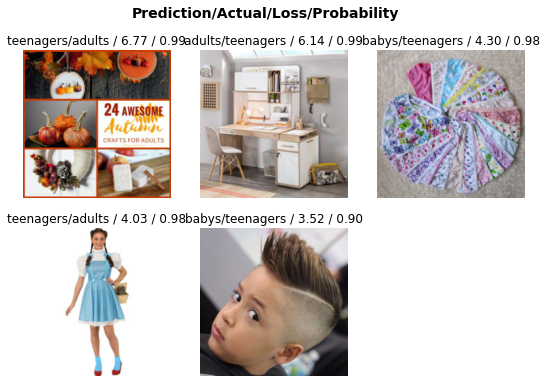

In [ ]:
interp.plot_top_losses(5)

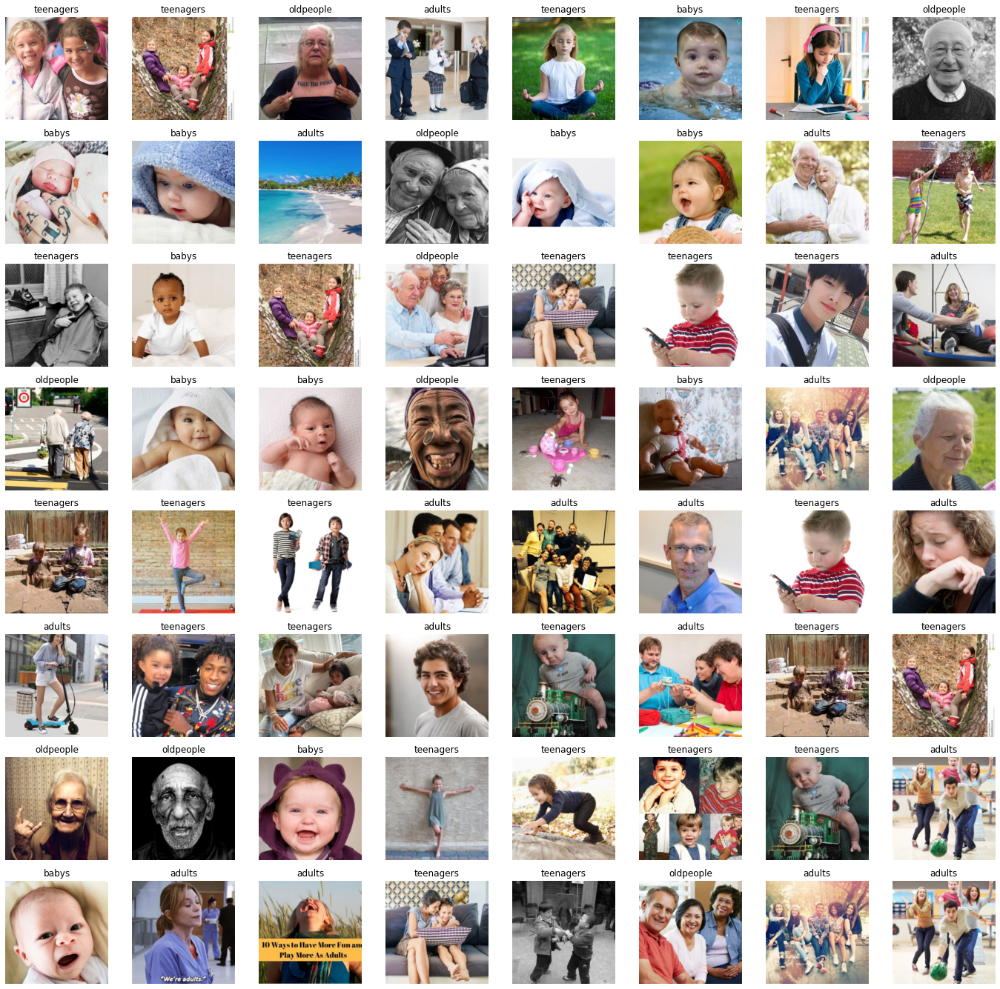

In [ ]:
edades = DataBlock(blocks=(ImageBlock, CategoryBlock),get_items=get_image_files,item_tfms=Resize(224), get_y = parent_label,splitter=RandomSplitter())

dls=edades.dataloaders('../notebooks/peopleimages/')
dls.valid.show_batch(max_n=64)

epoch,train_loss,valid_loss,error_rate,time
0,1.516501,0.348416,0.118421,00:06
1,0.811352,0.102819,0.026316,00:05
2,0.497117,0.086245,0.019737,00:05
3,0.337304,0.082067,0.019737,00:05


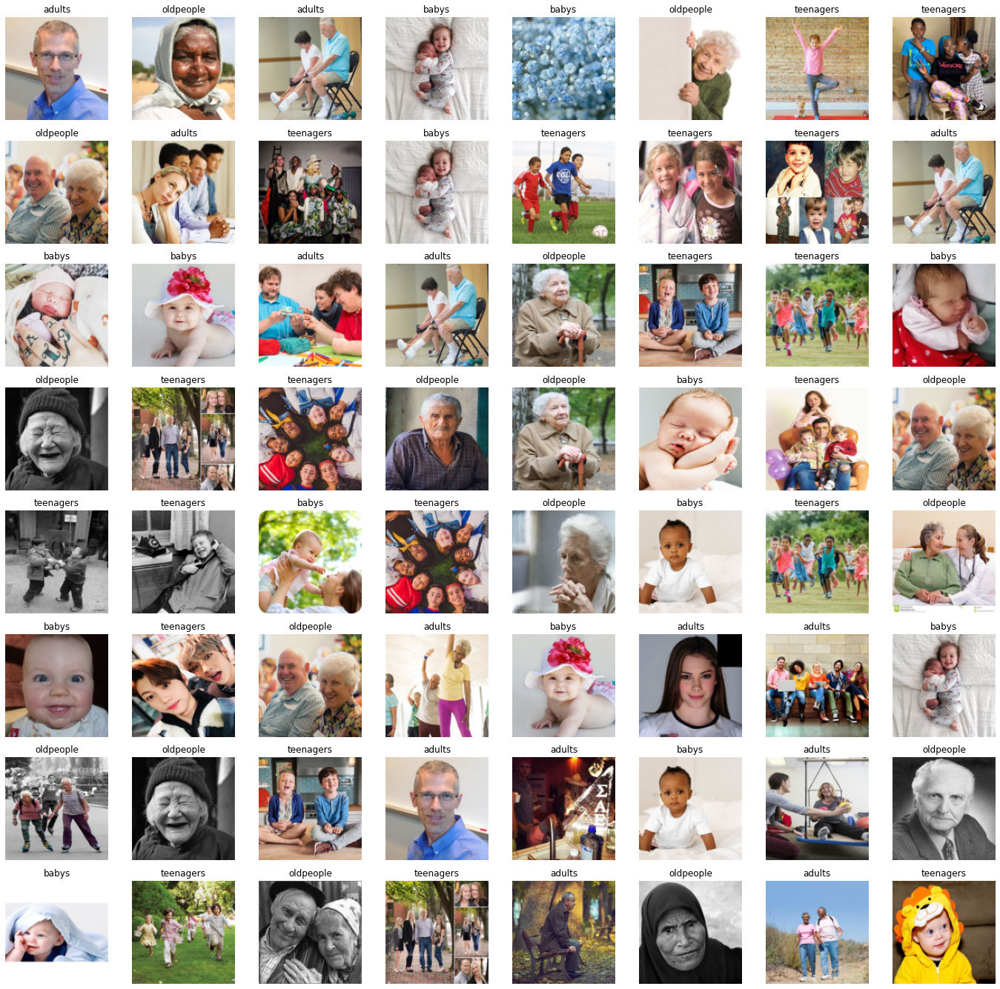

In [ ]:
edades2=edades.new(item_tfms=Resize(128,ResizeMethod.Squish))
dls2=edades2.dataloaders('../notebooks/peopleimages/')
dls2.valid.show_batch(max_n=64)
learn= cnn_learner(dls2,resnet34,metrics=error_rate)
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.623462,0.321974,0.085526,00:05
1,0.888592,0.131883,0.042763,00:05
2,0.548729,0.100956,0.019737,00:05
3,0.375913,0.098337,0.016447,00:05


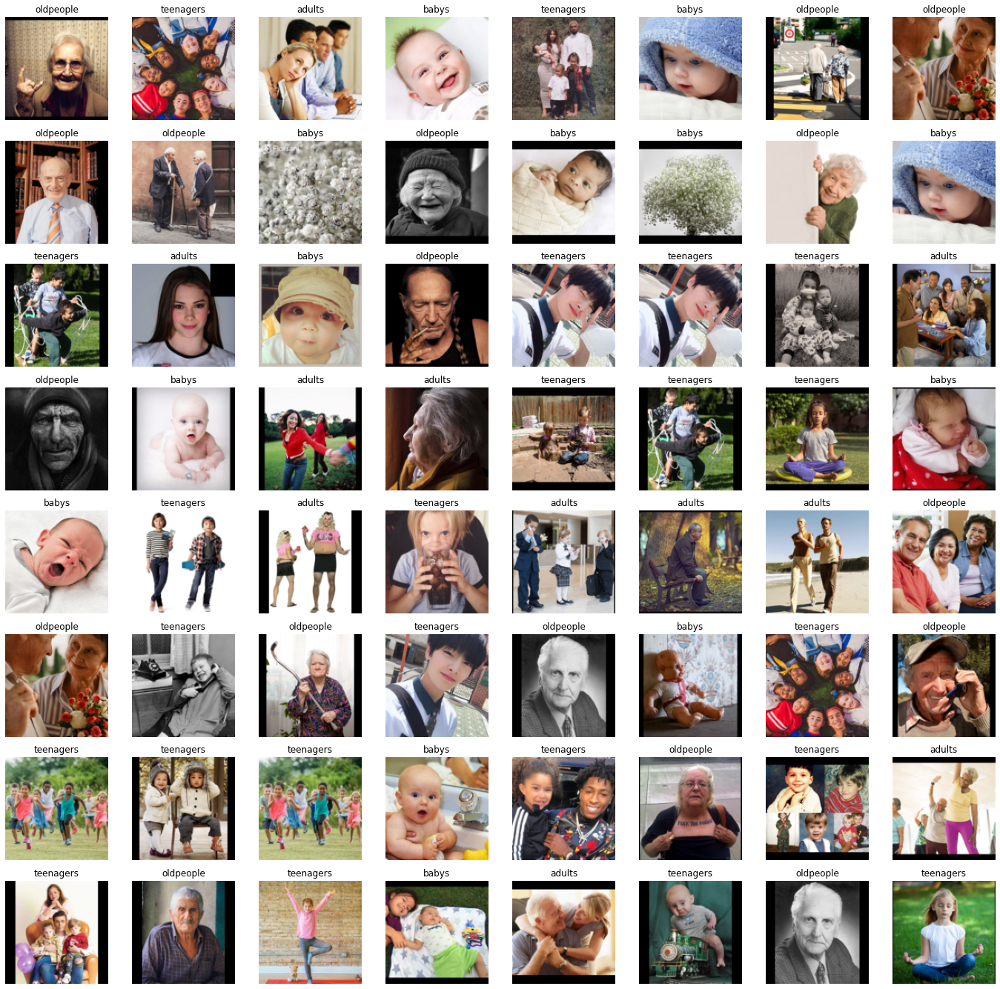

In [ ]:
edades3=edades.new(item_tfms=Resize(128,ResizeMethod.Pad,pad_mode='zeros'))
dls3=edades3.dataloaders('../notebooks/peopleimages/')
dls3.valid.show_batch(max_n=64)
learn= cnn_learner(dls3,resnet34,metrics=error_rate)
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.580396,0.619859,0.246711,00:05
1,0.835905,0.333807,0.115132,00:05
2,0.525352,0.261440,0.108553,00:05
3,0.350665,0.243935,0.108553,00:05


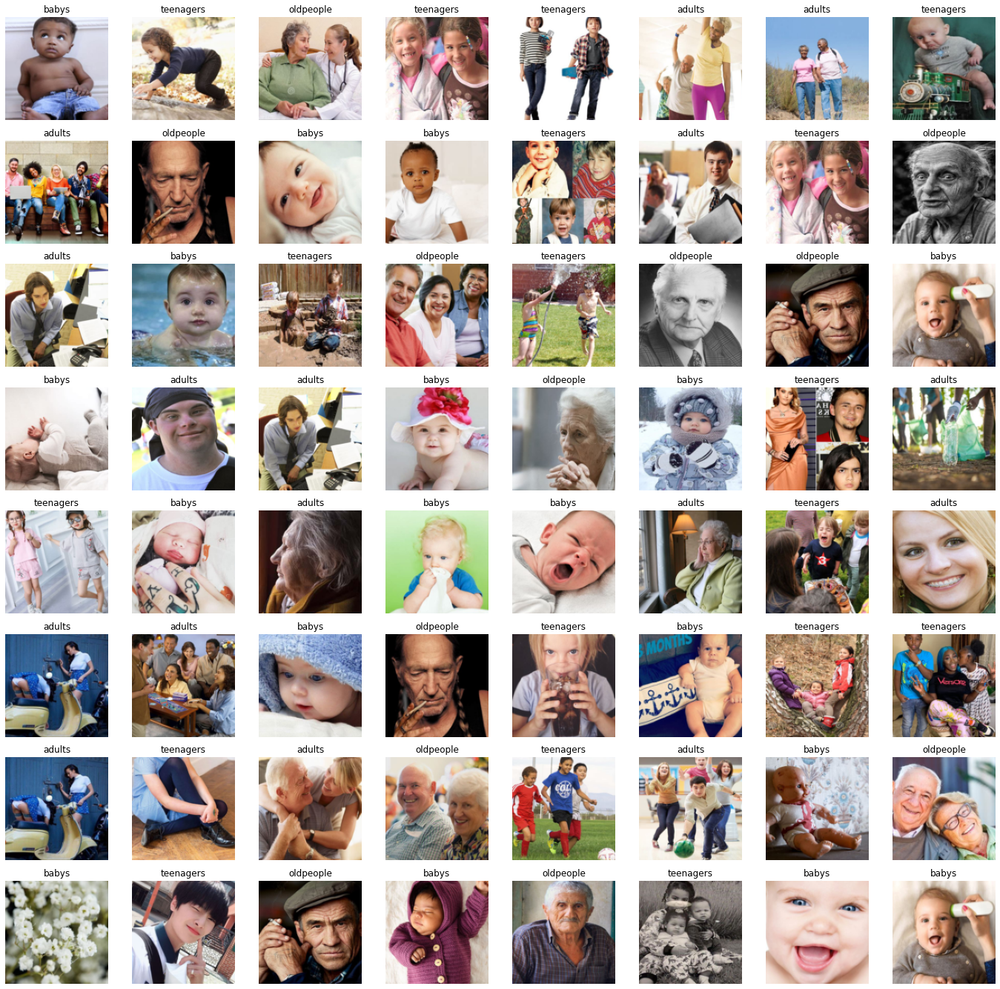

In [ ]:
#hide
#hide

edades4=edades.new(item_tfms=RandomResizedCrop(128,min_scale=1.9) )
dls4=edades4.dataloaders('../notebooks/peopleimages/')
dls4.valid.show_batch(max_n=64)
learn= cnn_learner(dls4,resnet34,metrics=error_rate)
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.684006,0.584846,0.230263,00:05
1,1.195584,0.307814,0.108553,00:05
2,0.922924,0.224529,0.069079,00:05
3,0.759510,0.213245,0.072368,00:05


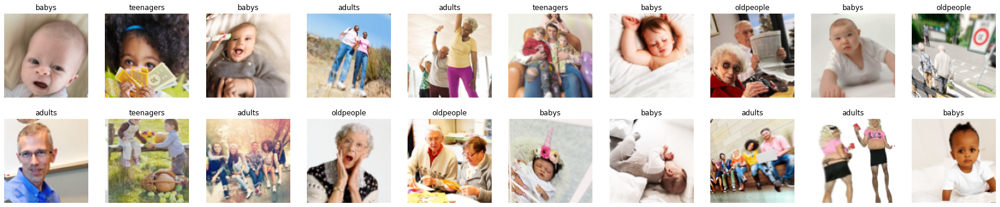

In [ ]:
#augmentation
#batch_tfms=aug_transforms(mult=2) retorna una lista de diferentes augmentations.
#image transforms happen one item at the time 
#el  batch le pasa a todo el mini batch al mismo tiempo y  la augmentation sucede súper más rápido
edades5 = edades.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls5 = edades5.dataloaders('../notebooks/peopleimages/')
dls5.train.show_batch(max_n=20, nrows=2)
learn= cnn_learner(dls5,resnet34,metrics=error_rate)
learn.fit_one_cycle(4)

In [ ]:
#te muestra las peorse categorias de los demas
cleaner= ImageClassifierCleaner(learn)
cleaner

NameError: name 'ImageClassifierCleaner' is not defined

In [ ]:
#for idx in cleaner.delete(): cleaner.fns[idx].unlink() #este es para eliminar SE ROMPIO
#for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]),path/cat)    #este es para cambiar

In [ ]:
learn.export() #crea un archivo de learner.

In [ ]:

learn_inf = load_learner('../notebooks/export.pkl') #cargo el learner
learn_inf.predict('../notebooks/probandoAI3.jpeg')

('adults', TensorImage(0), TensorImage([0.3588, 0.0028, 0.2856, 0.3529]))

In [ ]:
#estos 4 numeros  te dan las probabilidades de que sea cada uno
learn_inf.dls.vocab

['adults', 'babys', 'oldpeople', 'teenagers']

In [ ]:
%%js  %%html

<body>
    <script>
        function callthisfunction(){
            alert("adsflkj");
        }
    </script>
    <h1>Testing js  html  jupyter nootebooks</h1>
    <button onclick="callthisfunction()"></button>
</body>
</html>

<IPython.core.display.Javascript object>